In [1]:
!nvidia-smi

Sat Oct 12 08:42:45 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   57C    P8              13W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!git clone "https://github.com/ultralytics/yolov5"

Cloning into 'yolov5'...
remote: Enumerating objects: 16982, done.
remote: Counting objects: 100% (177/177), done.
remote: Compressing objects: 100% (124/124), done.
remote: Total 16982 (delta 91), reused 109 (delta 53), pack-reused 16805 (from 1)
Receiving objects: 100% (16982/16982), 15.71 MiB | 11.96 MiB/s, done.
Resolving deltas: 100% (11620/11620), done.


In [3]:
%cd yolov5/

/content/yolov5


In [4]:
!pip install -qr requirements.txt
import torch
from IPython.display import Image,clear_output
print("setup completed using %s %s" % (torch.__version__,torch.cuda.get_device_properties(0)))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.7/882.7 kB 55.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.9 MB/s eta 0:00:00
setup completed using 2.4.1+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


In [5]:
%cd /content

/content


In [12]:
import gdown
import os
url = "https://drive.google.com/file/d/106pcsr6PSIdes0gHC0yD0M8ljHQCqDLL/view?usp=sharing"
id = url.split('/')[-2]
prefix = "https://drive.google.com/uc?/export=download&id="
gdown.download(prefix+id,"PPE.zip")

Downloading...
From (original): https://drive.google.com/uc?/export=download&id=106pcsr6PSIdes0gHC0yD0M8ljHQCqDLL
From (redirected): https://drive.google.com/uc?%2Fexport=download&id=106pcsr6PSIdes0gHC0yD0M8ljHQCqDLL&confirm=t&uuid=2ab48101-e55a-4aad-ab32-3c6f1356eb11
To: /content/PPE.zip
100%|██████████| 182M/182M [00:00<00:00, 193MB/s]


'PPE.zip'

In [13]:
import zipfile
with zipfile.ZipFile("PPE.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/data")

In [14]:
!rm PPE.zip

In [16]:
import yaml
with open("/content/data.yaml","r") as stream:
  num_class = str(yaml.safe_load(stream)["nc"])
print(num_class)

5


In [17]:
%cat /content/yolov5/models/yolov5s.yaml

# Ultralytics YOLOv5 🚀, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4],

In [18]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [19]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_class}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]

# **Train the model**  
## **Parameters:**   
**img**: Image size  
**batch** : batch size  
**epochs** : number of training epochs  
**data**: set path to yaml file  
**cfg**: specify model config  
**weights**: specify  custom path to weights  
**name**: realust name  
**nosave**: only save the final checkpoint  
**cache**: cache img for faster training

In [20]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epoch 50 --data '../data.yaml' --cfg './models/custom_yolov5s.yaml' --weights 'yolov5s.pt' --name yolov5s_results  --cache

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
      11/49      2.06G    0.04619    0.04657    0.01544         88        416: 100% 63/63 [00:12<00:00,  4.97it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 4/4 [00:00<00:00,  4.25it/s]
                   all        119        715      0.903      0.677      0.791      0.387

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
  0% 0/63 [00:00<?, ?it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      12/49      2.06G    0.04356    0.04874    0.01315        214        416:   2% 1/63 [00:00<00:08,  7.24it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.a

In [21]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

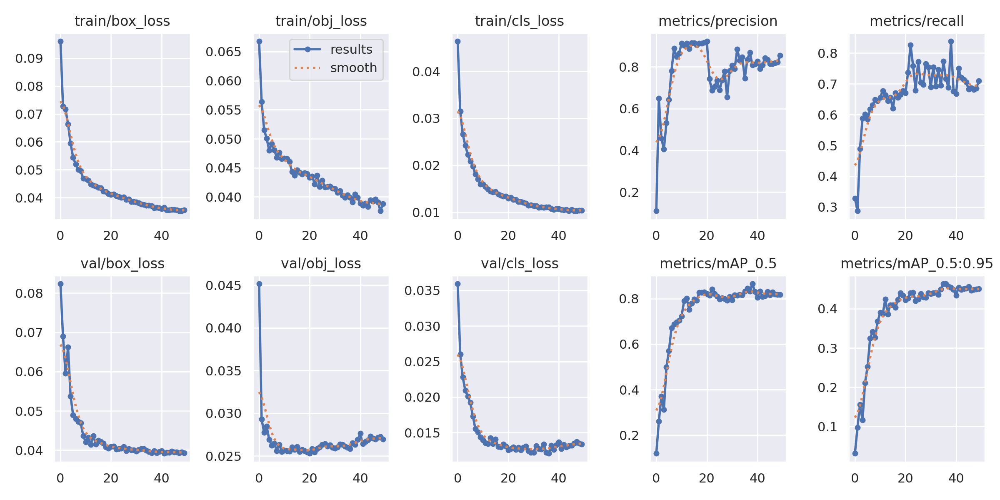

In [22]:
from utils.plots import plot_results
Image(filename="/content/yolov5/runs/train/yolov5s_results/results.png")

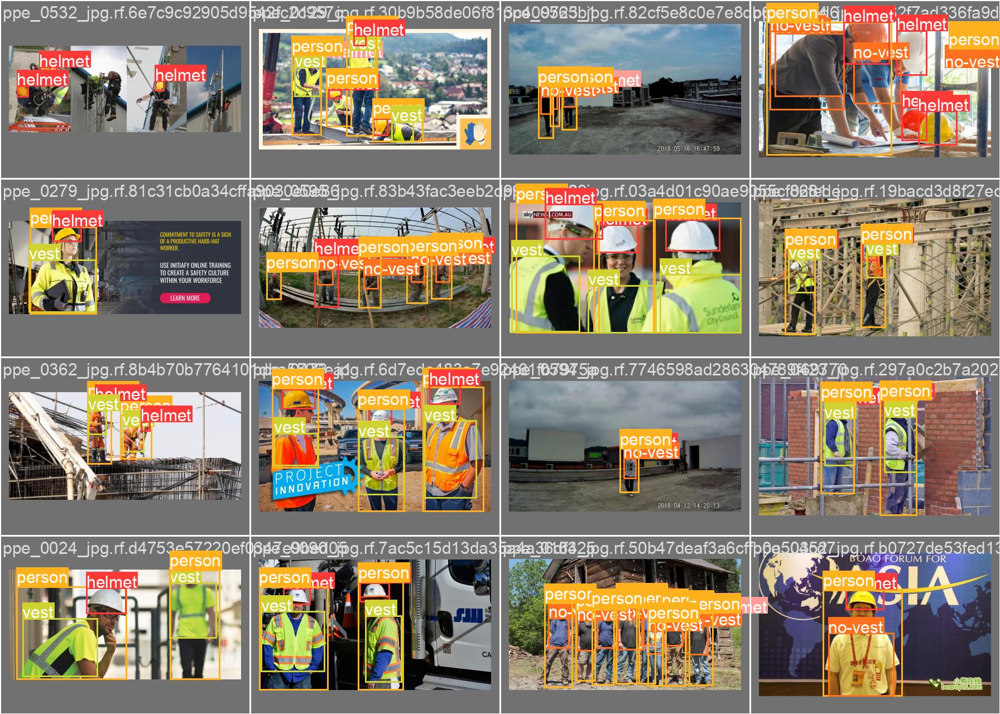

In [23]:
Image(filename="/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg")

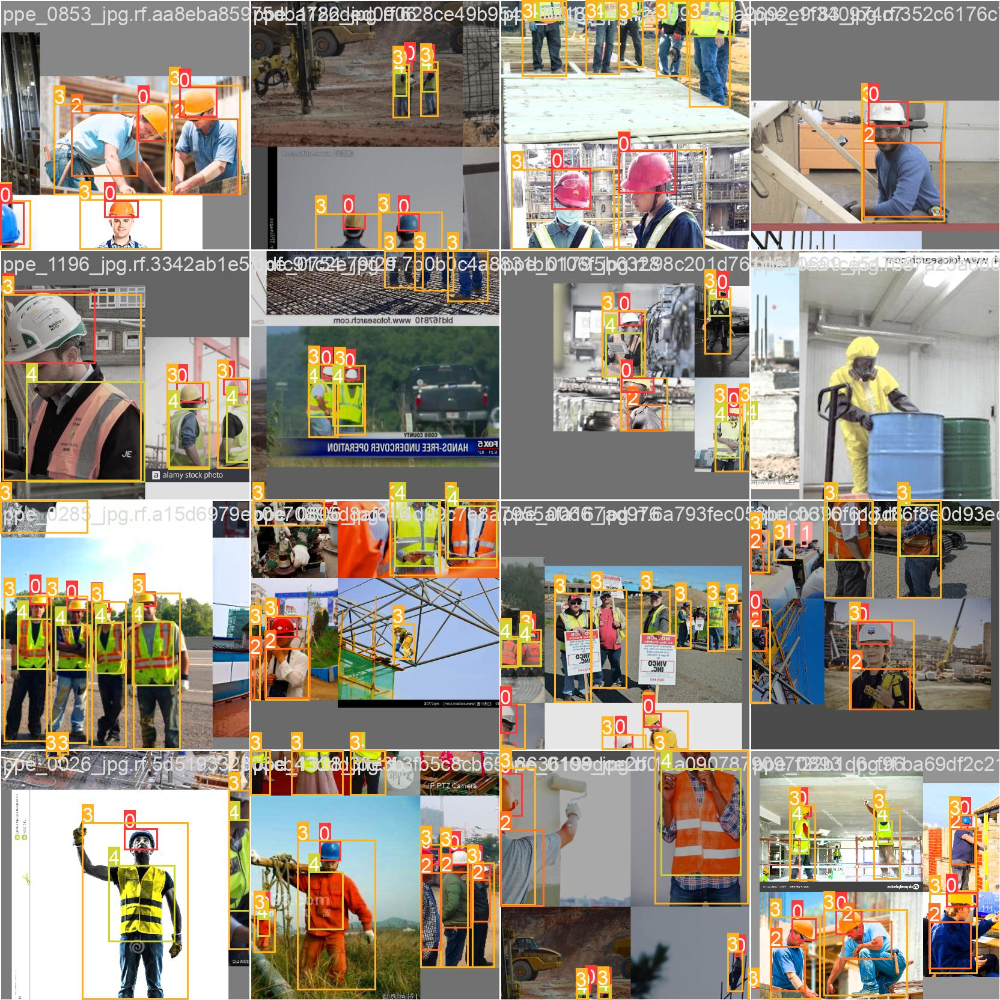

In [25]:
Image(filename = "/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg")

# Run Inference with training weights
**Run Inference using the best trained model on contents of test/images folder**

In [27]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [30]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --imgsz 416 --conf-thres 0.5 --source ../test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-372-ga3555241 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/90 /content/test/images/ppe_0000_jpg.rf.f15cb637c683aa3cd9d45b4a68265dc8.jpg: 288x416 1 helmet, 1 person, 1 vest, 27.9ms
image 2/90 /content/test/images/ppe_0004_jpg.rf.68b381521ab72c50feb1565bf211fca0.jpg: 416x416 3 helmets, 1 no-vest, 3 persons, 2 vests, 7.2ms
image 3/90 /

**Download the model**

In [33]:
from google.colab import drive
drive.mount('/content/gdrive')

**Model Saved**

In [35]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/drive/MyDrive/

**Model Saved**